In [ ]:
from IPython.display import clear_output 

In [ ]:
!pip install -U git+https://github.com/faustomorales/keras-ocr.git#egg=keras-ocr
!pip install -U 'opencv-python==4.5.1.48' # We need the most recent version of OpenCV.
!pip install easyocr
!sudo apt-get install libzbar0
!pip install pyzbar
%tensorflow_version 2.x
clear_output()

In [ ]:
!pip install pyzbar

In [ ]:
import shutil
import os
import cv2
import easyocr
from pyzbar.pyzbar import decode
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import zipfile
import datetime
import string
import glob
import math
import random
import tqdm
import matplotlib.pyplot as plt
import tensorflow as tf
import sklearn.model_selection
from google.colab import drive
import keras_ocr

tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [ ]:
# clone darknet repo
!git clone https://github.com/AlexeyAB/darknet

Cloning into 'darknet'...
remote: Enumerating objects: 15138, done.
remote: Counting objects: 100% (65/65), done.
remote: Compressing objects: 100% (40/40), done.
remote: Total 15138 (delta 29), reused 50 (delta 23), pack-reused 15073
Receiving objects: 100% (15138/15138), 13.50 MiB | 16.36 MiB/s, done.
Resolving deltas: 100% (10275/10275), done.


In [ ]:
# change makefile to have GPU and OPENCV enabled
%cd darknet
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile

# verify CUDA
!/usr/local/cuda/bin/nvcc --version

/content/darknet
nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Wed_Jul_22_19:09:09_PDT_2020
Cuda compilation tools, release 11.0, V11.0.221
Build cuda_11.0_bu.TC445_37.28845127_0


In [ ]:
# make darknet (build)
!make
clear_output()

In [ ]:
%cd /content

/content


In [ ]:
# dont forget to upload data.zip to /content via gui
# download url https://drive.google.com/file/d/1kGc4-lt51hNfn2McBqH1ydheBpoK3mLI/view?usp=sharing
# file structure
# /content------
#  |___/data----
#       |___/obj
#       |___ ....
#  |___/darknet-
#  |___data.zip

#%cd /content
!unzip data.zip -d /content/data 
clear_output()

In [ ]:
# training from scratch / weights saved in /content/data/backup - best weights on validation and last weights from each n iterations
!./darknet/darknet detector train ./data/obj.data ./data/yolov4-tiny-3l.cfg ./data/yolov4-tiny.conv.29 -map -dont_show

In [ ]:
# continue to train best
#!./darknet/darknet detector train ./data/obj.data ./data/yolov4-tiny-3l.cfg ./data/backup/yolov4-tiny-3l_last.weights -dont_show -map

In [ ]:
# continue to train fine tuned
#!./darknet/darknet detector train ./data/obj.data ./data/yolov4-tiny-3l.cfg ./data/backup/yolov4-tiny-3l_fine_tuned.weights -dont_show -map

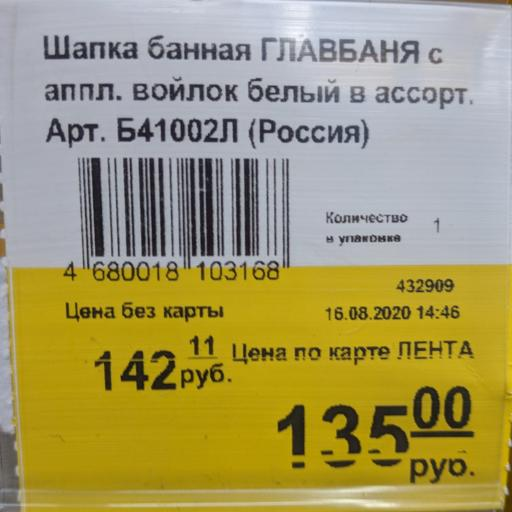

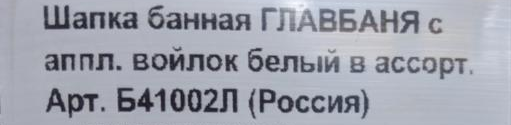

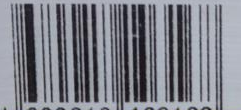

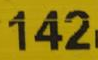

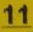

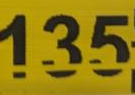

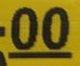

In [ ]:
!rm -rf /content/data/results
!mkdir /content/data/results

descriptions = []
barcodes = []
price11 = []
price12 = []
price21 = []
price22 = []

# save results to /content/results
for filename in os.listdir("/content/data/obj"):
  if filename.endswith("jpg"):
    !./darknet/darknet detector test ./data/obj.data ./data/yolov4-tiny-3l.cfg ./data/backup/yolov4-tiny-3l_fine_tuned.weights "./data/obj/{filename}" -dont_show -ext_output | tee pred.txt
    a_file = open("pred.txt", "r")
    lines = a_file.readlines()
    a_file.close()
    last_lines = [line for line in lines if ('width' in line and 'height' in line and 'left_x' in line)]
    clear_output()
    img = cv2.imread("/content/data/obj/"+filename)
    cv2_imshow(img)
    res = []
    for line in last_lines:
      spl = line.split()
      cords = {"class":spl[0][:-1], "conf_value":spl[1][:-1], "left_x":int(spl[3]), "top_y":int(spl[5]), 'width':int(spl[7]), 'height':int(spl[9][:-1])}
      res.append(cords)
    for box in res:
      x = box['left_x']
      y = box['top_y']
      w = box['width']
      h = box['height']
      if box['class'] == 'description': 
        x = 0
        w = 511
      if box['class'] == 'barcode':
        x = x - 15
        w = w + 30
      if (box['class'] == 'price11'):
        x = x - 5
        w = w + 10
        h = h + 10
        y = y - 5
      if (box['class'] == 'price12'):
        x = x - 7
        w = w + 12
        h = h + 10
        y = y - 5
      if (box['class'] == 'price21'):
        x = x - 2
        w = w + 4
        h = h + 4
        y = y - 2
      if (box['class'] == 'price22'):
        x = x - 3
        w = w + 6
        h = h + 6
        y = y - 3
      if (x < 0): x=0
      if (y < 0): y=0
      if (w < 0): w=0
      if (h < 0): h=0
      if (x > 511): x=511
      if (y > 511): y=511
      if (w > 511): w=511
      if (h > 511): h=511
      y2 = y+h
      x2 = x+w
      if (y2 > 511): y2 =511
      if (x2 > 511): x2 =511
      if (y > y2): y = y2
      if (x > x2): x = x2

      crop_img = img[y:y+h, x:x+w]
      apps = {
              'description':descriptions.append,
              'barcode':barcodes.append,
              'price11':price11.append,
              'price12':price12.append,
              'price21':price21.append,
              'price22':price22.append
             }
      cv2_imshow(crop_img)
      apps[box['class']](crop_img)

    os.remove("pred.txt")
    f = open(filename[:-4]+".txt", "w")
    for line in last_lines:
      f.write(line)
    f.close()
    shutil.move("/content/predictions.jpg", "/content/data/results/"+filename)
    shutil.move("/content/"+filename[:-4]+".txt", "/content/data/results/"+filename[:-4]+".txt")


In [ ]:
import easyocr

In [ ]:
reader = easyocr.Reader(['ru','en']) # need to run only once to load model into memory

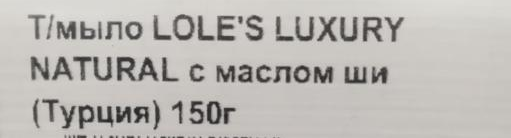

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


 Тмыло LOLE'S LUXURY NATURAL c маслом ши (Турция) 15Ог


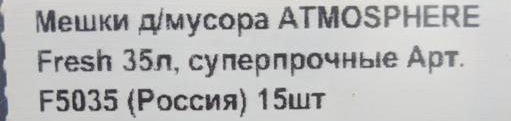

 Мешки дмусора ATMOSPHERE Fresh ЗБл, суперпрочные Арт F5О35 (Россия) 1Sшт


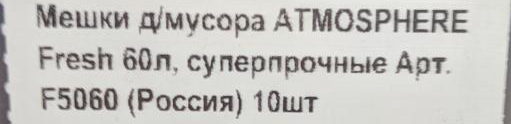

 Мешки дмусора 4TMOSPHERE Fresh бОл, суперпрочные Арт F5О60 (Россия) 1Ошт


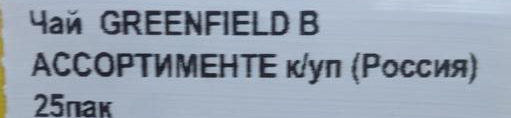

 Чай GREENFIELD B АССOРTимЕНТЕ куп (Россия) 25пак


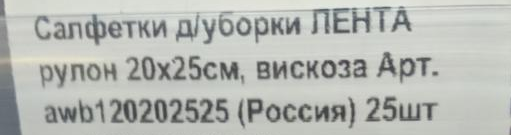

 Салфетки дуборки ЛЕНТА 2Ox25см, вискоза Аpт awb120202525 (Россия) 25шт рулон


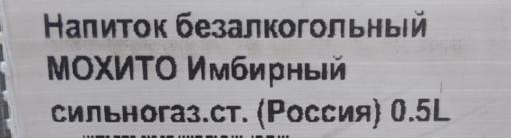

 Напиток безалкогольный МОХИТо Имбирный сильногаз.ст (Россия} 0.5L


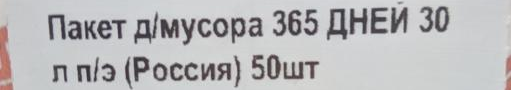

 Пакет д мусора Зб5 ДНЕИ ЗО Л п/э  Россия) 5Ошт


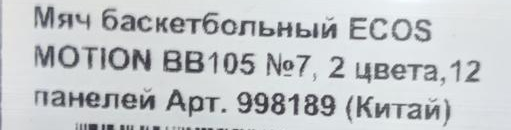

 Мяч баскетбольный ECOS MOTION BB1O5 Ng7, 2 цвета 12 панелей Арт. 998189 ( Китай


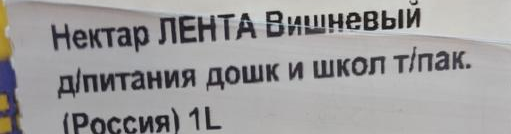

 Нектар ЛЕНТА Вишневый и школ тпак дпитания АРоссия 1L дошк


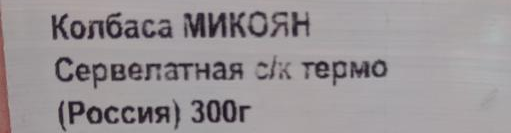

 Колбаса МикОяН Сервелатная зк гермо АРоссия) ЗООг


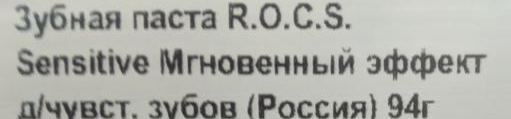

 Зубная паста R.O.C.S. Sensitive Мгновенный эффект пчVвстзубов  Россия 94г


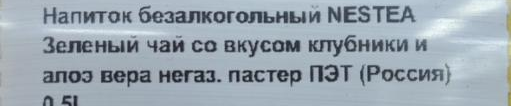

 Напиток безалкогольныи NESTEA Зеленый чай сo вкусом клубники алоэ вера негаз. пастер ПЭТ Россия}


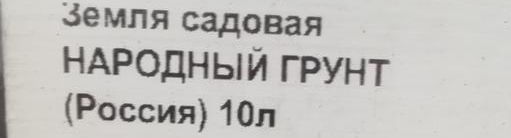

 Земля садовая НАродный Грунт РРоссия) 1Ол


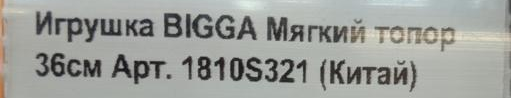

 Игрушка BIGGA Мягкий топор Збсм Арт. 181ОSЗ21 (Китай)


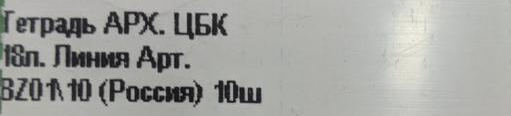

 Гетрадь АРХ. ЦБК ISл. Линия Арт . BZП111 (Россия} 1lw


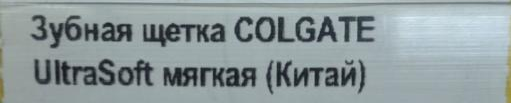

 Зубная щетка COLGATE UltraSoft мягкая {Китай)


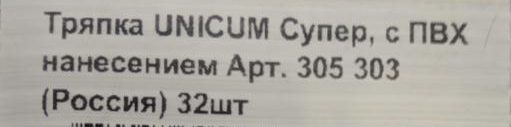

 Тряпка UNICUM с ПВХ нанесением Арт 3О5 ЗОЗ Россия) 32шт Супер,


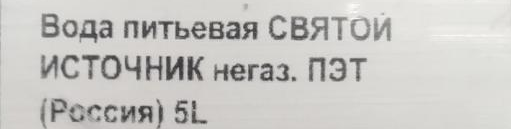

 питьевая святой источник негаз  ПЭТ АРассия 5t Вода


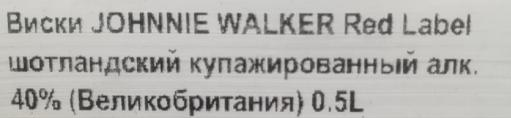

 Виски JOHNNIE WALKER Red Label шотландский купажированный алк 40% (Великобритания 0 5L


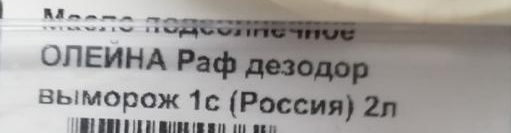

 isassiiric s0010;8 ОЛЕИНА Раф дезодор выморож 1с (Россия) 2л n7333


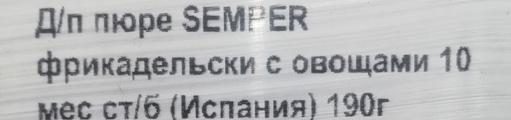

 Дп пюре SEMRER фрикадельски с овощами 1О нес стб (Испания 1дОг


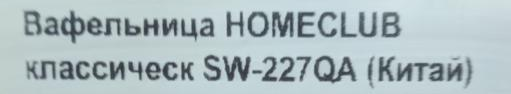

 Вафельница HOMECLUB классическ SW-ZZ7OA { Китай)


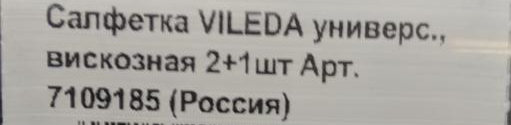

 Салфетка VILEDA универс , вискозная 2+1шт Арт 7109185 (Россия)


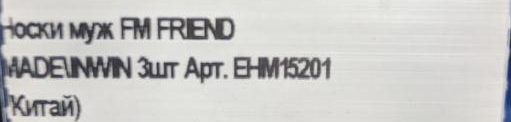

 поскимJж FМ FREND MADEININЗшт Apт BKМ1ZО1 Кипай


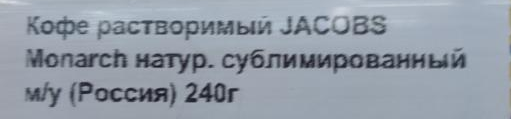

 Кофе раствориный Уксовs ionarch натур сублинированный ily {Россияр 24Ог


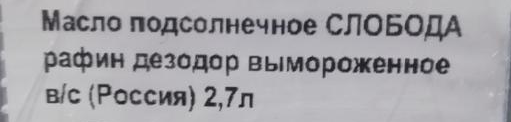

 Масло подсолнечное СлобоДА рафин дезодор вымороженное вИс  Россия) 2,Тл


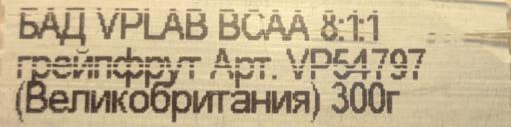

 БАД VPLAB БCAA $:л1 !P54797 Великобриганияр ЗООг Ap6:


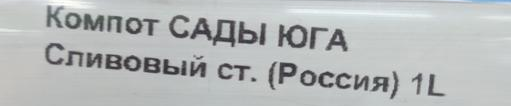

 Компот ЮГА Сливовый ст (Россия) 1L САДы


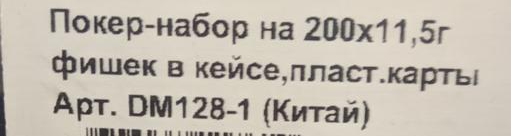

 Покер набор на 2ООх11,5г фишек в кейсе пласт карты DMM128-1 (Китай ) АрТ .


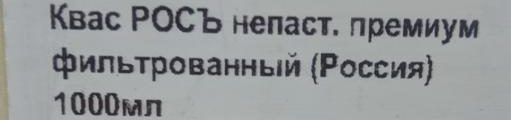

 Квас РоСъ непаст  премиум фильтрованный РРоссия| 1ОООмл


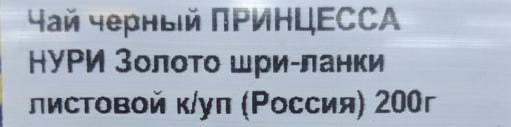

 Чай черный ПРИНЦЕССА НУРИ Золото шри ланки листовой кlуп (Россия) 2ООг


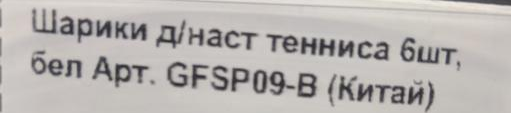

 днаст тенниса Аpт. GFSPOS B (Китай ) Шарики бшт, бел


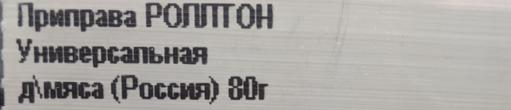

 Прилрава РоЛлтоН Универсальная дамяса (Россияр 8Пт


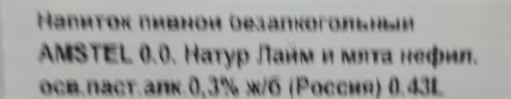

 MaNDUR DHAVRHK00 VS8 INWNUINDLRPMD 81830 B015 S1 SB B]1 Aavю


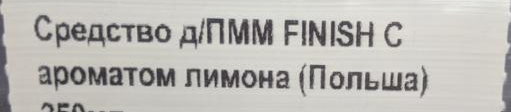

 Средство дПММ FINISH C ароматом лимона ( Польша)


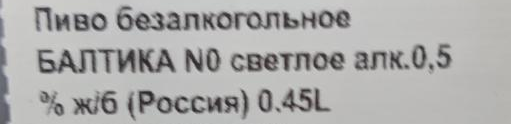

 Пиво безалкогольное БАлтика NO светлое алк 0 5 % жб (Россия) 0,45L


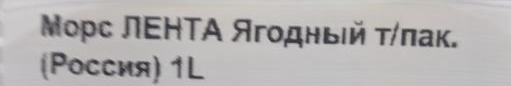

 ЛЕНТА Ягодный тпак. Росскя 1L Klopc


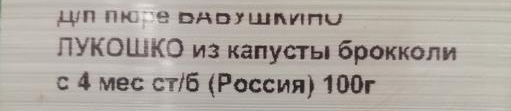

 шп пюле pkoyшnyinu Лукошко из капусты брокколи с4 мес стIб (Россия) 1ООг


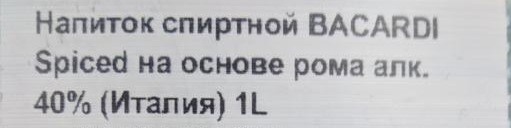

 Напиток спиртной BACARDI Spiced на основе рома алк 40% (Италия) 1L


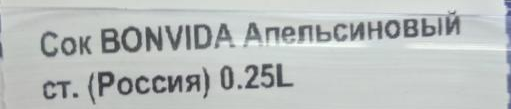

 Сoк BONVIDA Апельсиновый ст. (Россия) 0.25L


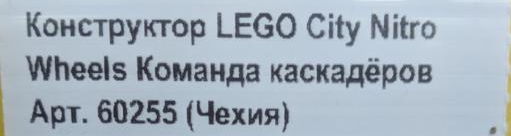

 Конструктор LEGO Nitro Wheels Команда каскадёров Арт. 60255 (Чехия ) City


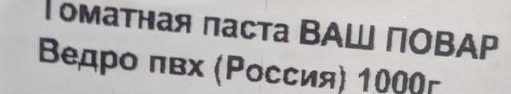

 Ks паста ВАШ ПОВАР ПВХ (Россия} 1ООО оматная Ведро


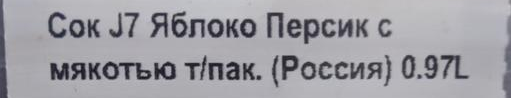

 Сок J7 Яблоко Персик с мякотью тпак. {Россия| 0.97L


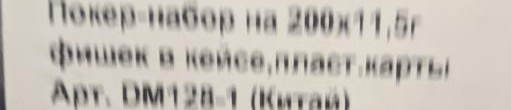

 B0 ЦI 1 01 D R Sa NO


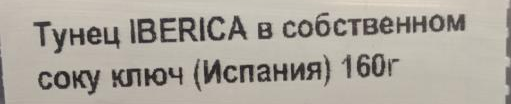

 Тунец IBERICA в собственном соку ключ (Испания} 16Оr


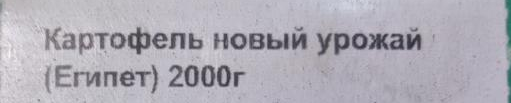

 Картофель новый урожай {Египет| 2OООг


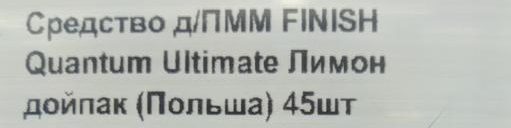

 Средство дПММ FINISH Quantum Ultimate Лимон дойпак ППольша) 4Бшт


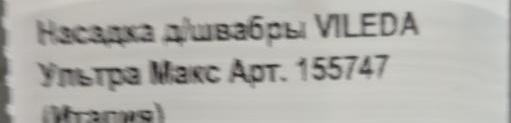

 iisiъчвзбзы VILEDA уmie Kans Apit 1557!7 283


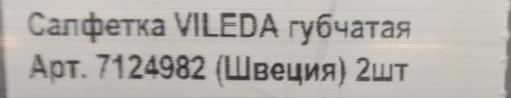

 Салфетка VILEDA губчатая Арт. 7124982 (Швецияр 2шт


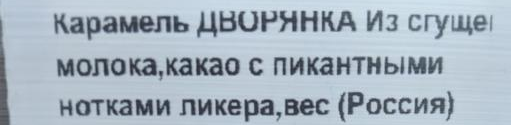

 Карамель ЦНUНННКА Из сгущег молока какао с пикантными нотками ликера вес (Россия)


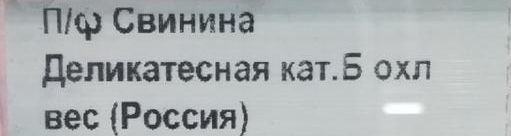

 Пф Свинина Деликатесная кат Б охл вес Россия


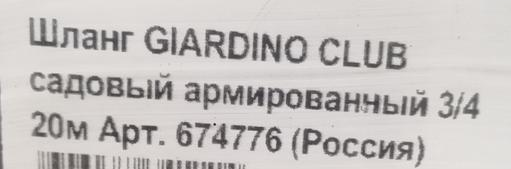

 GIARDINO CLUB садовый армированчый ЗИ4 674776 (Россия) Шланг 2Ом АрТ.


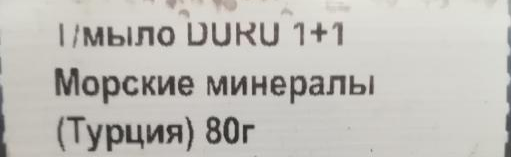

 Iмыло DUkU 1+1 Морские минералы (Турция) 8Ог


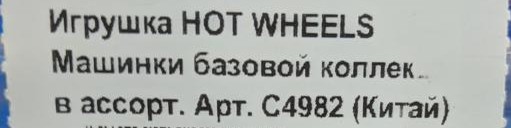

 Игрушка HOT WHEELS Машинки базовой коллек в ассорт Арт С4982 (Китай)


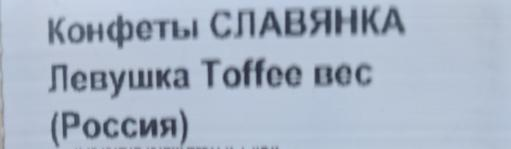

 Конфеты СПАЦЯНКА Левушка Toffcc пас {Россин)


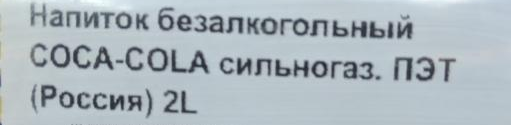

 Напиток безалкогольный COCA-COLA сильногаз ПЭТ {Россия) 2L


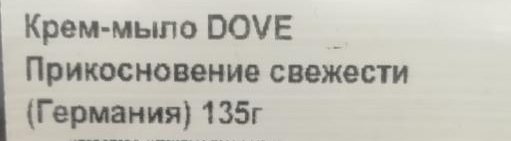

 Крем мыло DOVE Прикосновение свежести ГГермания| 1ЗБг


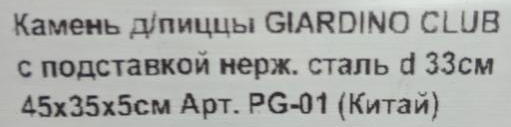

 Камень дпиццы GIARDINO CLUB с подставкой нерж. сталь d ЗЗсм 45хЗ5х5см Арт  PGЮ1 Китай )


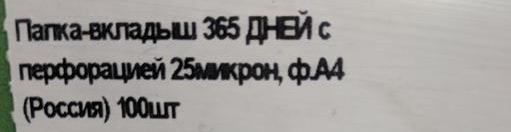

 Папка вкладьш 35 ДНВЙ с перфорацией 2ыикрон фАА РРосаа) Тшт


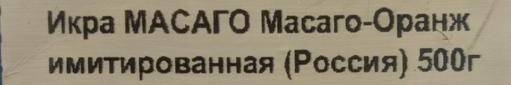

 Икра МАСАГО Масаго Оранж имитированная РРоссия) 5ООг


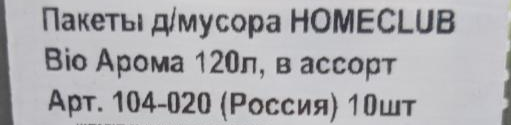

 Пакеты д мусора HOMECLUB Bio Арома в ассорт Арт. 1О4-О20 (Россия) 1 Ошт 12Ол,


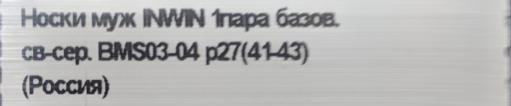

 Носки муж INVV! 1тара басов св сер. BMSO3 4 p27(4143) ОРоссия)


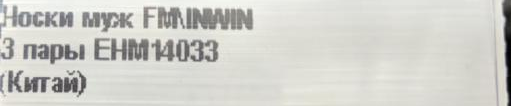

 Носки мук FiNIN 3 пары ЕНк1изз Киттай)


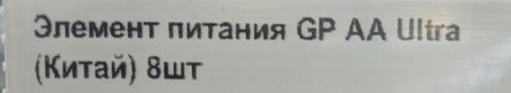

 Элемент питания GP AA Ultra {Китай) 8шт


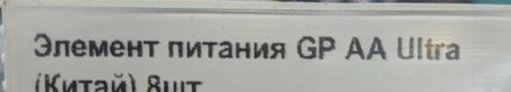

 Элемент питания GP AA Ultra ККитам


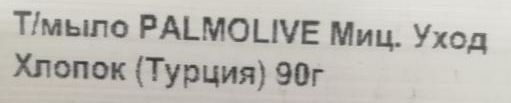

 Тмыло PALMOLIVE Миц Хлопок ( Турция) 9Ог Уход


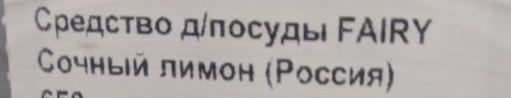

 Средство дпосуды FAIRY Сочный лимон Россия)


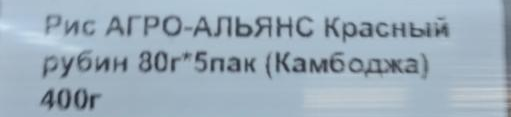

 Рис АГРО Альянс Красным рубин ЗОг"Бпак ( Камбодка 4005


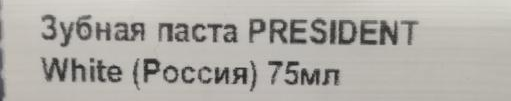

 Зубная паста PRESIDENT White (Россия) 7Бмл


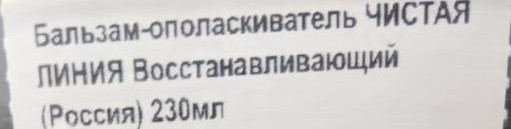

 Бальзам ополаскиватель ЧИСТАя ЛиНИя Восстанавливающий Россия  2зОмл


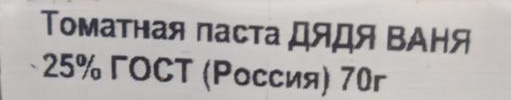

 Томатная паста ДяДя ВАНЯ 25% ГОСТ (Россия) 7Or


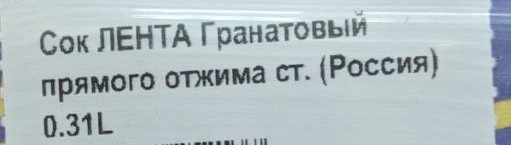

 Сок ЛЕНТА Гранатовый отжима ст (Россия) прямого 0.31L


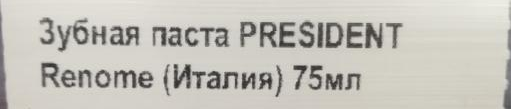

 Зубная паста PRESIDENT Renome (Италия} 7Бмл


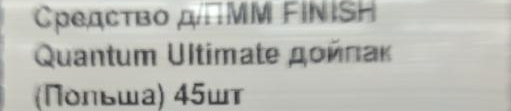

 Средство дi::MI FIniSa Quantum Ultimnale дойпак ;Польша) 4Swт


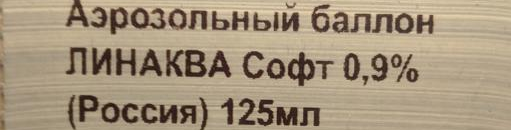

 Аэрозольный баллон ЛИНАКВА Софт 0,9% Россия) 12Бмл


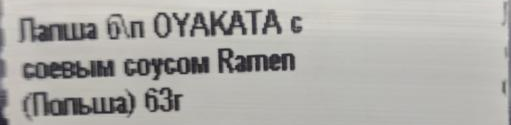

 Лапцаа бп ОYAКАТА с соевым соусом Ramen <Польип) 6Зг


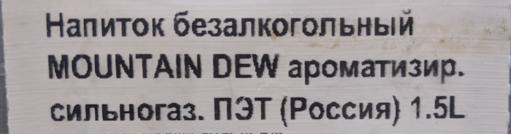

 Напиток безалкогольный MOUNTAIN DEW ароматизир сильногаз ПЭТ (Россия} 1 5L


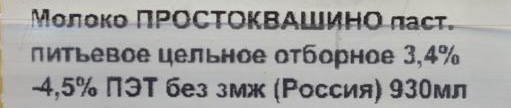

 Молоко простоквашино паст литьевое целькое отборное 3,4% 4,5% ПЭТ без змж (Россия) 9ЗОмл


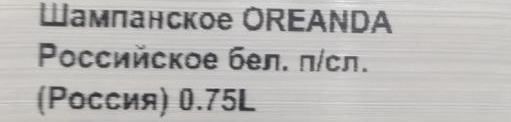

 Шампанское OREANDA Российское бел. пёсл. КРоссня) 0.7SL


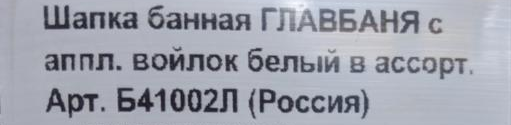

 Шапка банная ГЛАВБАНЯ с аппл. войлок белый в ассорт Арт  БА1ООЗЛ (Россия)


In [ ]:
for img in descriptions:
  cv2_imshow(img)
  result = reader.readtext(img)
  text = ""
  for box in result:
    text = text + " " + box[1]
  print(text)

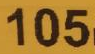

 105


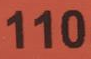

 110


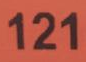

 121


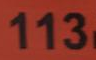

 113


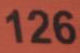

 126


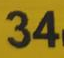

 34


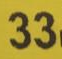

 33


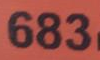

 683


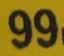

 99


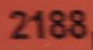

 2188


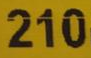

 210


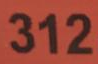

 312


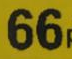

 66


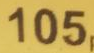

 105


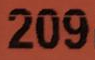

 209


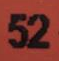

 52


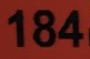

 184


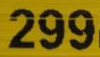

 299


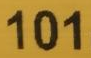

 101


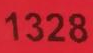

 1328


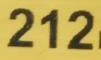

 212


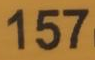

 157


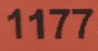

 1177


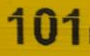

 101


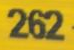

 262


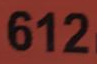

 612


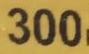

 300


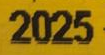

 2025


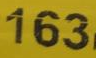

 163


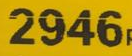

 2946


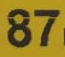

 87


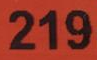

 219


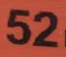

 52


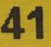

 41


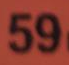

 59


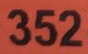

 352


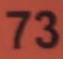

 73


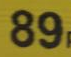

 89


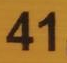

 41


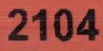

 2104


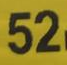

 52


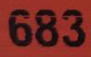

 683


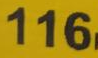

 116


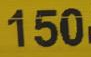

 150


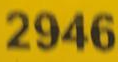

 2946


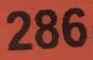

 286


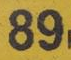

 89


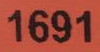

 1691


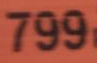

 799


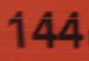

 144


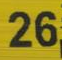

 26


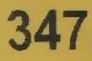

 347


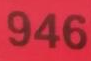

 946


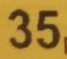

 35


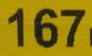

 167


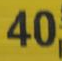

 40


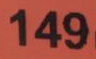

 149


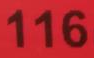

 116


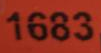

 1683


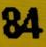

 84


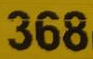

 368


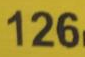

 126


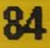

 84


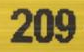

 209


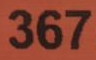

 367


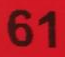

 61


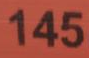

 145


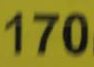

 170


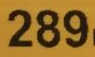

 289


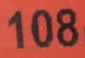

 108


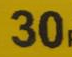

 30


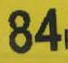

 84


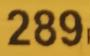

 289


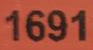

 1691


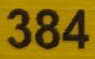

 384


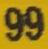

 99


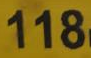

 118


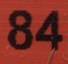

 84


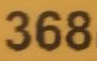

 368


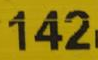

 142


In [ ]:
for img in price11:
  cv2_imshow(img)
  #print(reader.readtext(img, allowlist='1234567890'))
  result = reader.readtext(img, allowlist='1234567890')
  text = ""
  for box in result:
    text = text + " " + box[1]
  print(text)

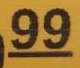

 99


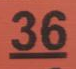

 36


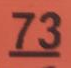

 73


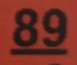

 89


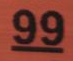

 99


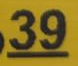

 39


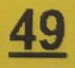

 49


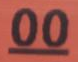

 00


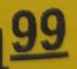

 99


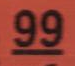

 99


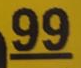

 99


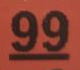

 99


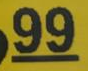

 99


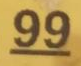

 99


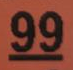

 99


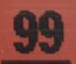

 99


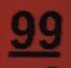

 99


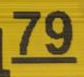

 79


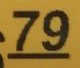

 79


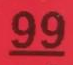

 99


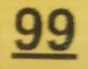

 99


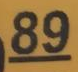

 89


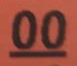

 00


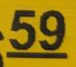

 59


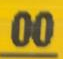

 00


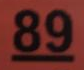

 89


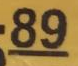

 89


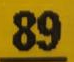

 89


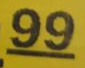

 99


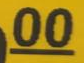

 00


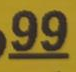

 99


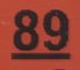

 89


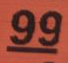

 99


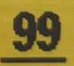

 99


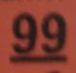

 99


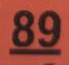

 89


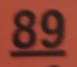

 89


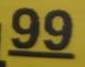

 99


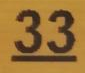

 33


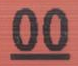

 00


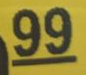

 99


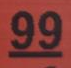

 99


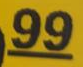

 99


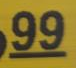

 99


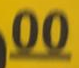

 00


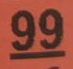

 99


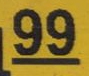

 99


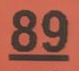

 89


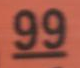

 99


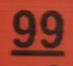

 99


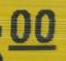

 00


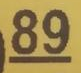

 89


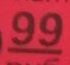

 99


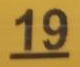

 19


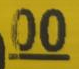

 00


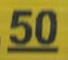

 50


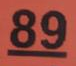

 89


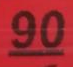

 90


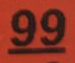

 99


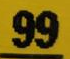

 99


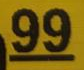

 99


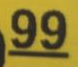

 99


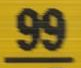

 99


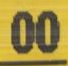

 00


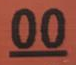

 00


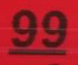

 99


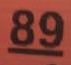

 89


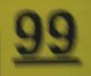

 99


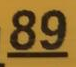

 89


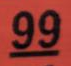

 99


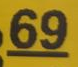

 69


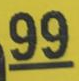

 99


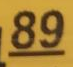

 89


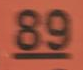

 89


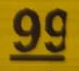

 99


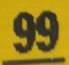

 99


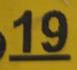

 19


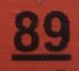

 89


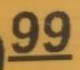

 99


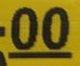

 00


In [ ]:
for img in price12:
  cv2_imshow(img)
  #print(reader.readtext(img, allowlist='1234567890'))
  result = reader.readtext(img, allowlist='1234567890')
  text = ""
  for box in result:
    text = text + " " + box[1]
  print(text)

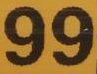

 99


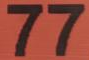

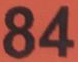

 84


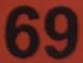

 69


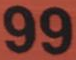

 99


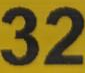

 32


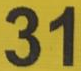

 31


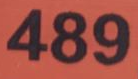

 489


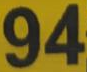

 94


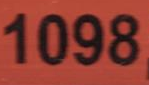

 1098


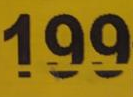

 199


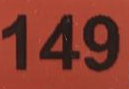

 149


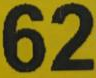

 62


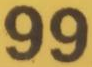

 99


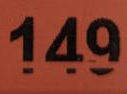

 149


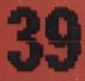

 39


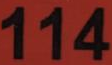

 114


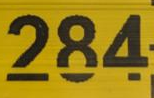

 284


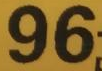

 96


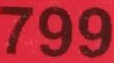

 799


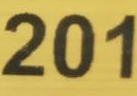

 201


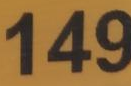

 149


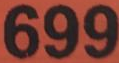

 699


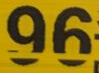

 96


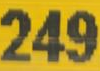

 249


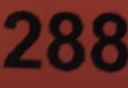

 288


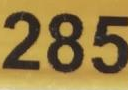

 285


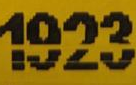

 1923


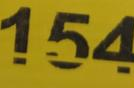

 154


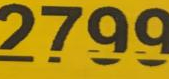

 2799


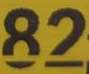

 82


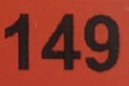

 149


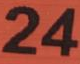

 24


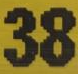

 38


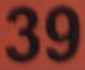

 39


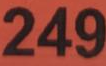

 249


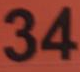

 34


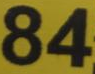

 84


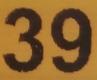

 39


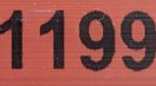

 1199


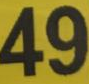

 49


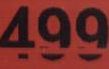

 499


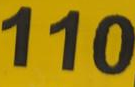

 110


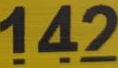

 142


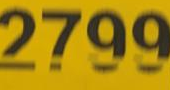

 2799


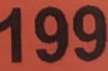

 199


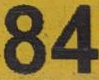

 84


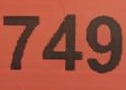

 749


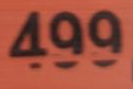

 499


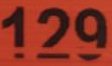

 129


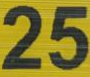

 25


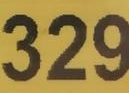

 329


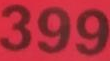

 399


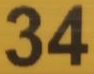

 34


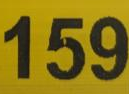

 159


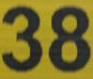

 38


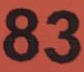

 83


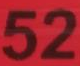

 52


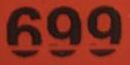

 699


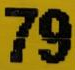

 79


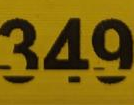

 349


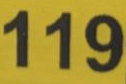

 119


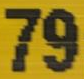

 79


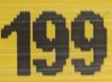

 199


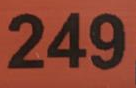

 249


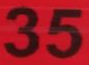

 35


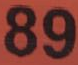

 89


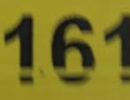

 161


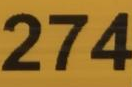

 274


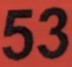

 53


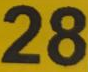

 28


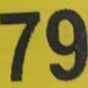

 79


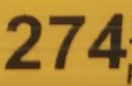

 274


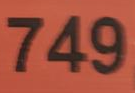

 749


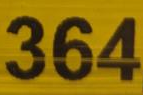

 364


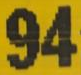

 94


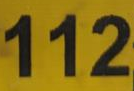

 112


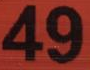

 49


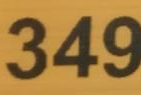

 349


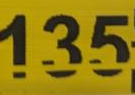

 135


In [ ]:
for img in price21:
  cv2_imshow(img)
  #print(reader.readtext(img, allowlist='1234567890'))
  result = reader.readtext(img, allowlist='1234567890')
  text = ""
  for box in result:
    text = text + " " + box[1]
  print(text)

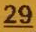

 29


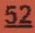

 52


 05


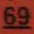

 69


 39


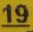

 19


 19


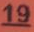

 19


 99


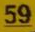

 59


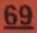

 69


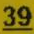

 39


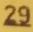

 29


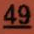

 49


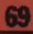

 69


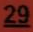

 29


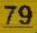

 79


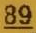

 89


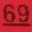

 69


 69


 79


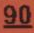

 90


 69


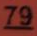

 79


 99


 19


 19


 39


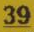

 39


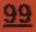

 99


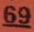

 69


 09


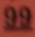

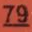

 79


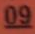

 09


 49


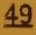

 49


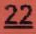

 22


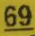

 69


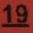

 19


 89


 59


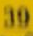

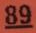

 89


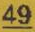

 49


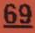

 69


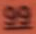

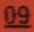

 09


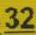

 32


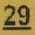

 29


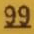

 99


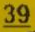

 39


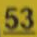

 53


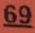

 69


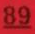

 89


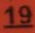

 19


 19


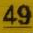

 49


 39


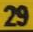

 29


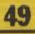

 49


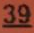

 39


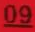

 09


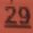

 29


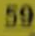

 39


 49


 29


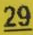

 29


 39


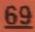

 69


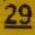

 29


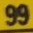

 99


 19


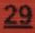

 29


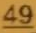

 49


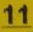

 11


In [ ]:
for img in price22:
  cv2_imshow(img)
  #print(reader.readtext(img, allowlist='1234567890'))
  result = reader.readtext(img, allowlist='1234567890')
  text = ""
  for box in result:
    text = text + " " + box[1]
  print(text)

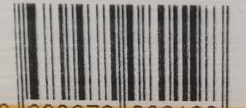

Type: EAN13
Data: b'8680972080198'



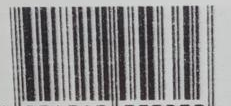

Type: EAN13
Data: b'4691212050356'



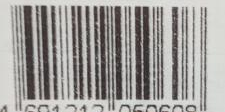

Type: EAN13
Data: b'4691212050608'



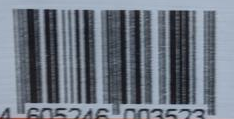

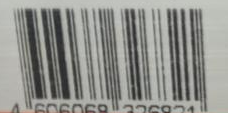

Type: EAN13
Data: b'4606068326821'



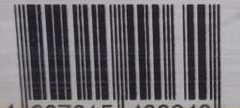

Type: EAN13
Data: b'4607015490640'



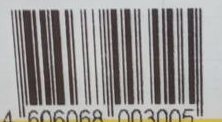

Type: EAN13
Data: b'4606068003005'



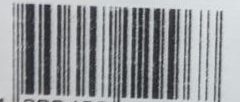

Type: EAN13
Data: b'4690408129968'



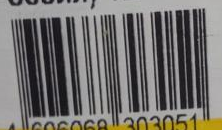

Type: EAN13
Data: b'4606068303051'



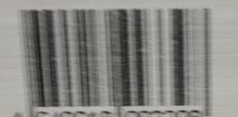

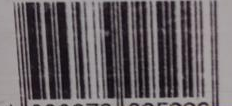

Type: EAN13
Data: b'4606979025226'



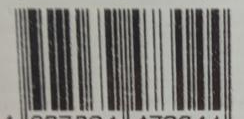

Type: EAN13
Data: b'4607034473044'



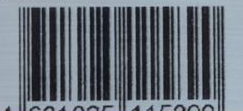

Type: EAN13
Data: b'4601025115890'



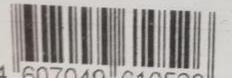

Type: EAN13
Data: b'4607049610526'



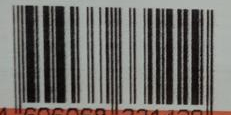

Type: EAN13
Data: b'4606068331429'



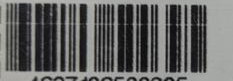

Type: EAN13
Data: b'4607106500395'



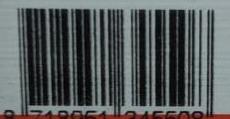

Type: EAN13
Data: b'8718951345508'



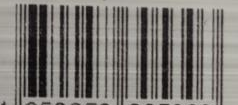

Type: EAN13
Data: b'4650058305303'



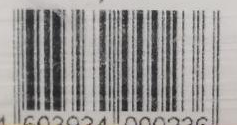

Type: EAN13
Data: b'4603934000236'



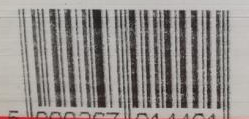

Type: EAN13
Data: b'5000267014401'



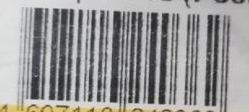

Type: EAN13
Data: b'4607110240362'



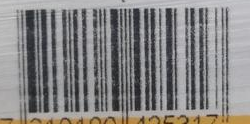

Type: EAN13
Data: b'7310100425317'



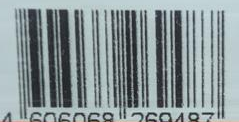

Type: EAN13
Data: b'4606068269487'



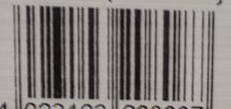

Type: EAN13
Data: b'4023103208087'



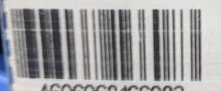

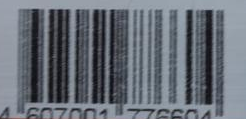

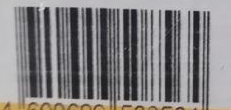

Type: EAN13
Data: b'4600699508564'



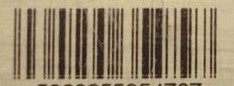

Type: EAN13
Data: b'5060255354797'



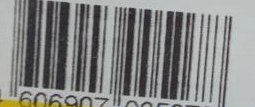

Type: EAN13
Data: b'4606907005078'



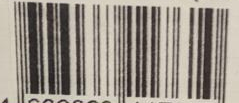

Type: EAN13
Data: b'4606068117610'



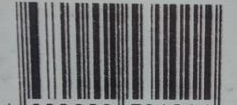

Type: EAN13
Data: b'4680002531014'



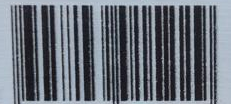

Type: EAN13
Data: b'4605246015229'



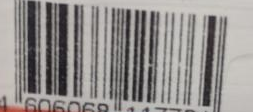

Type: EAN13
Data: b'4606068117764'



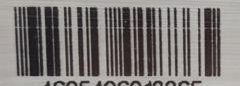

Type: EAN13
Data: b'4605496018865'



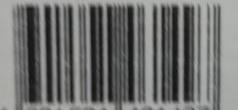

Type: EAN13
Data: b'4601501461497'



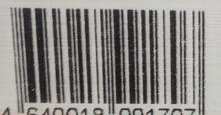

Type: EAN13
Data: b'4640018991707'



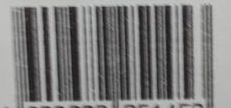

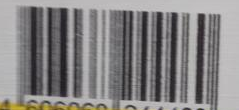

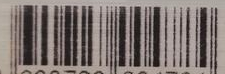

Type: EAN13
Data: b'4600728004784'



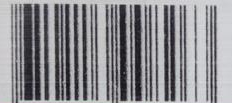

Type: EAN13
Data: b'7610113008263'



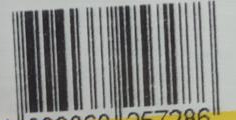

Type: EAN13
Data: b'4606068257286'



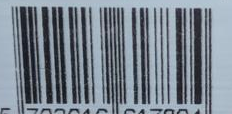

Type: EAN13
Data: b'5702016617894'



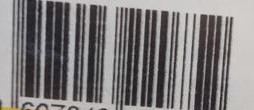

Type: EAN13
Data: b'4607043220752'



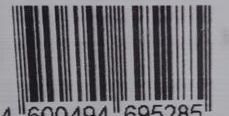

Type: EAN13
Data: b'4600494695285'



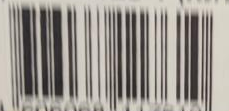

Type: EAN13
Data: b'4606068117610'



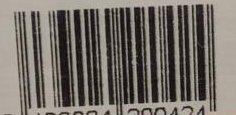

Type: EAN13
Data: b'8436024290424'



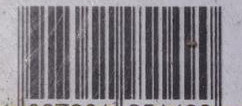

Type: EAN13
Data: b'4607001951490'



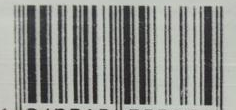

Type: EAN13
Data: b'4640018993374'



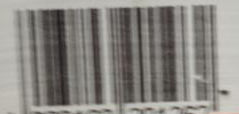

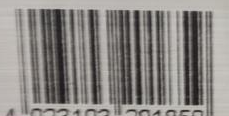

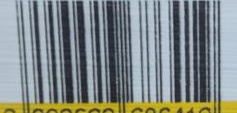

Type: EAN13
Data: b'2999999686419'



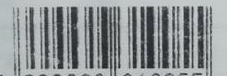

Type: EAN13
Data: b'2999999310055'



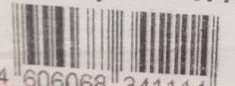

Type: EAN13
Data: b'4606068341114'



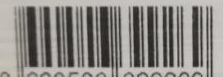

Type: EAN13
Data: b'8690506399269'



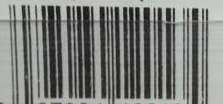

Type: EAN13
Data: b'0027084120134'



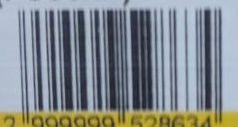

Type: EAN13
Data: b'2999999528634'



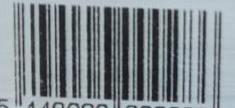

Type: EAN13
Data: b'5449000000286'



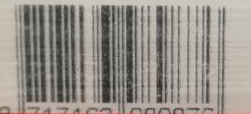

Type: EAN13
Data: b'8717163989876'



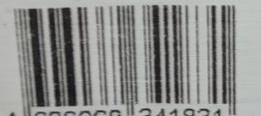

Type: EAN13
Data: b'4606068341831'



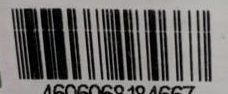

Type: EAN13
Data: b'4606068184667'



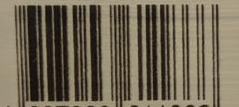

Type: EAN13
Data: b'4607003611866'



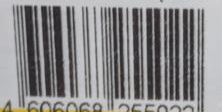

Type: EAN13
Data: b'4606068255022'



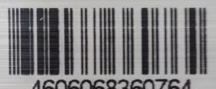

Type: EAN13
Data: b'4606068360764'



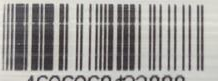

Type: EAN13
Data: b'4606068123888'



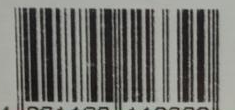

Type: EAN13
Data: b'4891199113390'



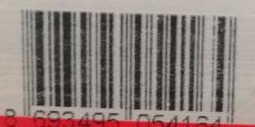

Type: EAN13
Data: b'8693495054164'



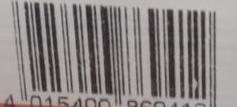

Type: EAN13
Data: b'4015400869412'



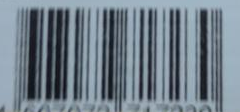

Type: EAN13
Data: b'4607072717230'



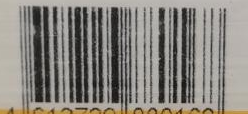

Type: EAN13
Data: b'4612729880168'



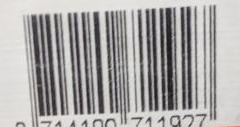

Type: EAN13
Data: b'8714100711927'



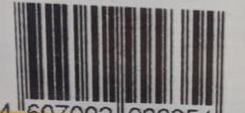

Type: EAN13
Data: b'4607002999354'



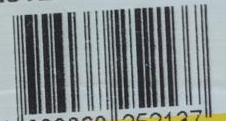

Type: EAN13
Data: b'4606068252137'



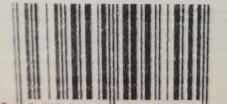

Type: EAN13
Data: b'8030009500791'



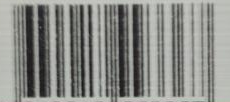

Type: EAN13
Data: b'4640018993367'



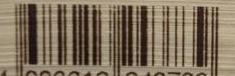

Type: EAN13
Data: b'4680013243739'



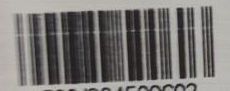

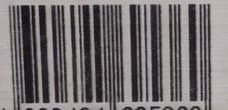

Type: EAN13
Data: b'4600494695360'



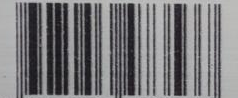

Type: EAN13
Data: b'4607053473537'



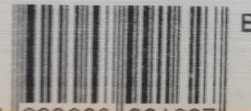

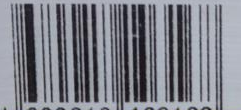

Type: EAN13
Data: b'4680018103168'



In [ ]:
for img in barcodes:
  cv2_imshow(img)
  decoded_objects = decode(img)
  for obj in decoded_objects:
        # draw the barcode
        #print("detected barcode:", obj)
        #image = draw_barcode(obj, img)
        # print barcode type & data
        print("Type:", obj.type)
        print("Data:", obj.data)
  #s = decode(img)
  #data = s.data
  print()
  #print(data)

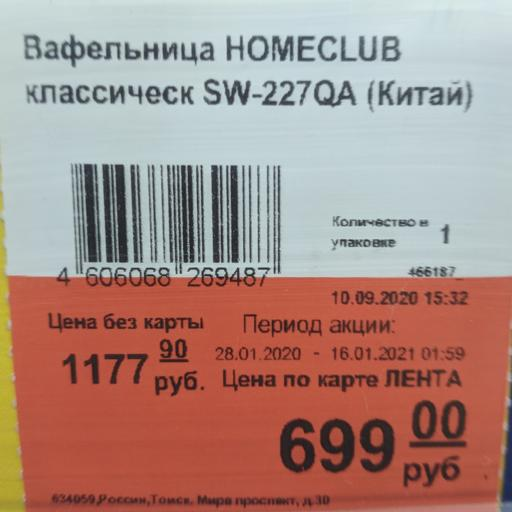

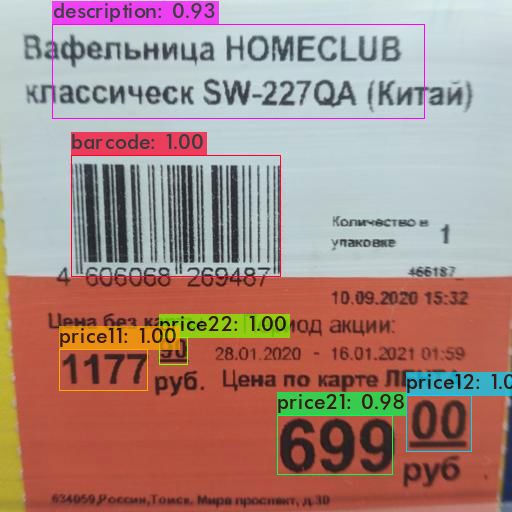

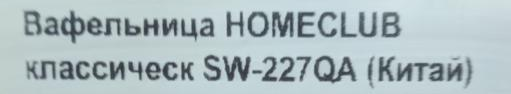

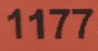

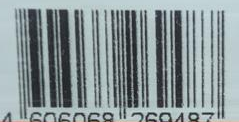

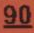

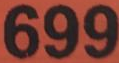

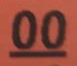

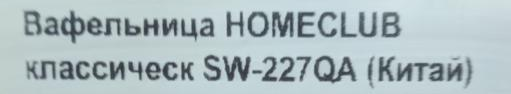

 Вафельница HOMECLUB классическ SW-ZZ7OA { Китай)


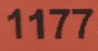

[([[1, 3], [98, 3], [98, 45], [1, 45]], '1177', 0.783654743014037)]


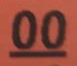

[([[3, 3], [77, 3], [77, 63], [3, 63]], '00', 0.998294321948408)]


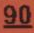

[([[0, 0], [34, 0], [34, 32], [0, 32]], '90', 0.9999876931424155)]


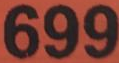

[([[0, 0], [119, 0], [119, 63], [0, 63]], '699', 0.9990492463111877)]


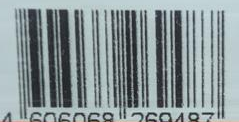

[Decoded(data=b'4606068269487', type='EAN13', rect=Rect(left=15, top=10, width=209, height=97), polygon=[Point(x=15, y=11), Point(x=15, y=17), Point(x=17, y=57), Point(x=19, y=95), Point(x=20, y=105), Point(x=119, y=107), Point(x=224, y=106), Point(x=224, y=10)])]


In [ ]:
# демонстрация работы
sdescriptions = []
sbarcodes = []
sprice11 = []
sprice12 = []
sprice21 = []
sprice22 = []
!./darknet/darknet detector test ./data/obj.data ./data/yolov4-tiny-3l.cfg ./data/backup/yolov4-tiny-3l_fine_tuned.weights "./data/obj/photo(6).jpg" -dont_show -ext_output | tee pred.txt
filename = "photo(6).jpg"
a_file = open("pred.txt", "r")
lines = a_file.readlines()
a_file.close()
last_lines = [line for line in lines if ('width' in line and 'height' in line and 'left_x' in line)]
clear_output()
img = cv2.imread("/content/data/obj/"+filename)
cv2_imshow(img)
cv2_imshow(cv2.imread("predictions.jpg"))
res = []
for line in last_lines:
  spl = line.split()
  cords = {"class":spl[0][:-1], "conf_value":spl[1][:-1], "left_x":int(spl[3]), "top_y":int(spl[5]), 'width':int(spl[7]), 'height':int(spl[9][:-1])}
  res.append(cords)
for box in res:
  x = box['left_x']
  y = box['top_y']
  w = box['width']
  h = box['height']
  if box['class'] == 'description': 
    x = 0
    w = 511
  if box['class'] == 'barcode':
    x = x - 15
    w = w + 30
  if (box['class'] == 'price11'):
    x = x - 5
    w = w + 10
    h = h + 10
    y = y - 5
  if (box['class'] == 'price12'):
    x = x - 7
    w = w + 12
    h = h + 10
    y = y - 5
  if (box['class'] == 'price21'):
    x = x - 2
    w = w + 4
    h = h + 4
    y = y - 2
  if (box['class'] == 'price22'):
    x = x - 3
    w = w + 6
    h = h + 6
    y = y - 3
  if (x < 0): x=0
  if (y < 0): y=0
  if (w < 0): w=0
  if (h < 0): h=0
  if (x > 511): x=511
  if (y > 511): y=511
  if (w > 511): w=511
  if (h > 511): h=511
  y2 = y+h
  x2 = x+w
  if (y2 > 511): y2 =511
  if (x2 > 511): x2 =511
  if (y > y2): y = y2
  if (x > x2): x = x2
  crop_img = img[y:y+h, x:x+w]
  apps = {
          'description':sdescriptions.append,
          'barcode':sbarcodes.append,
          'price11':sprice11.append,
          'price12':sprice12.append,
          'price21':sprice21.append,
          'price22':sprice22.append
        }
  cv2_imshow(crop_img)
  apps[box['class']](crop_img)
os.remove("pred.txt")
f = open(filename[:-4]+".txt", "w")
for line in last_lines:
  f.write(line)
f.close()
os.remove("/content/predictions.jpg")
os.remove("/content/"+filename[:-4]+".txt")
for img in sdescriptions:
  cv2_imshow(img)
  result = reader.readtext(img)
  text = ""
  for box in result:
    text = text + " " + box[1]
  print(text)
for img in sprice11:
  cv2_imshow(img)
  print(reader.readtext(img, allowlist='1234567890'))
for img in sprice12:
  cv2_imshow(img)
  print(reader.readtext(img, allowlist='1234567890'))
for img in sprice22:
  cv2_imshow(img)
  print(reader.readtext(img, allowlist='1234567890'))
for img in sprice21:
  cv2_imshow(img)
  print(reader.readtext(img, allowlist='1234567890'))
for img in sbarcodes:
  cv2_imshow(img)
  s = decode(img)
  print(s)

In [ ]:
from google.colab import files
!zip -r /content/data.zip /content/data/
files.download('data.zip')
#clear_output()

updating: content/data/ (stored 0%)
updating: content/data/labels/ (stored 0%)
updating: content/data/labels/56_2.png (deflated 7%)
updating: content/data/labels/44_2.png (deflated 14%)
updating: content/data/labels/113_3.png (deflated 8%)
updating: content/data/labels/59_2.png (deflated 13%)
updating: content/data/labels/71_7.png (deflated 1%)
updating: content/data/labels/42_1.png (deflated 13%)
updating: content/data/labels/62_6.png (deflated 4%)
updating: content/data/labels/51_5.png (deflated 3%)
updating: content/data/labels/66_0.png (deflated 15%)
updating: content/data/labels/43_2.png (deflated 15%)
updating: content/data/labels/95_6.png (deflated 15%)
updating: content/data/labels/82_4.png (deflated 6%)
updating: content/data/labels/121_0.png (deflated 15%)
updating: content/data/labels/93_6.png (deflated 16%)
updating: content/data/labels/118_7.png (deflated 4%)
updating: content/data/labels/54_0.png (deflated 14%)
updating: content/data/labels/116_0.png (deflated 17%)
updati

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>